# Basic preliminary analysis of donor P13 snRNA-seq data (MFI) to exclude doublets by GEX and genotype

10.2021


(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do normalising & log transforming of raw count data
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- scale data (necessary for subsequent PCA)
- perform PCA (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logistic regression model to have a guideline of cell states**
- compute neighborhood graph (BBKNN can be used in case of playing with batch correction)
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- compute UMAP embedding
- perform unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import bbknn
# requires 'pip install scrublet'
import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyte

A Benjamini-Hochberg function for later. Running FDR is surprisingly inconvenient using built-in Python options.

In [4]:
def bh(pvalues):
    '''
    Computes the Benjamini-Hochberg FDR correction.
    
    Input:
        * pvals - vector of p-values to correct
    '''
    n = int(pvalues.shape[0])
    new_pvalues = np.empty(n)
    values = [ (pvalue, i) for i, pvalue in enumerate(pvalues) ]
    values.sort()
    values.reverse()
    new_values = []
    for i, vals in enumerate(values):
        rank = n - i
        pvalue, index = vals
        new_values.append((n/rank) * pvalue)
    for i in range(0, int(n)-1):
        if new_values[i] < new_values[i+1]:
            new_values[i+1] = new_values[i]
    for i, vals in enumerate(values):
        pvalue, index = vals
        new_pvalues[index] = new_values[i]
    return new_pvalues

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

## Reading the preprocessed object

Preprocessing happened in S0 notebook

In [6]:
# reading the raw filtered object as preprocessed and saved in notebook S0
adata = sc.read(save_path+'adata_raw_filtered.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 94014 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [8]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [9]:
np.unique(adata.obs['donor'])

array(['P13'], dtype=object)

In [10]:
np.unique(adata.obs['age'])

array(['8-9_PCW'], dtype=object)

In [11]:
adata.obs.head()

,n_genes,donor,tissue_block,age,sample,percent_mito,n_counts,dataset,technique,scrublet_score,scrublet_cluster_score,bh_pval,batch,is_doublet
barcode_sample,,,,,,,,,,,,,,
AAACCCAAGATACATG-1_WSSS_PLA8764121,1253,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000000,1820.0,snRNA-seq,10X,0.191617,0.127593,0.783593,0,False
AAACCCAAGTTGGAAT-1_WSSS_PLA8764121,2810,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000208,4811.0,snRNA-seq,10X,0.220000,0.228130,0.032820,0,True
AAACCCACAAATCCCA-1_WSSS_PLA8764121,1279,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000535,1868.0,snRNA-seq,10X,0.032895,0.031216,0.783593,0,False
AAACCCACAACTGTGT-1_WSSS_PLA8764121,473,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000000,556.0,snRNA-seq,10X,0.091892,0.112936,0.783593,0,False
AAACCCACAAGCTGCC-1_WSSS_PLA8764121,1360,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000473,2116.0,snRNA-seq,10X,0.012335,0.022983,0.803757,0,False


In [12]:
adata.obs['barcode_sample_copy'] = adata.obs.index

In [13]:
# quick check to see if raw is raw or not
expr_mtx_dense = adata[adata.obs['sample'] == 'WSSS_PLA8764121'].X.todense()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [14]:
# YAS we all good
np.unique(expr_mtx_dense)

matrix([[   0.,    0.,    0., ..., 3341., 4238., 9029.]], dtype=float32)

________

# Adding souporcell results

Here splitting into maternal and fetal barcodes by genotype where applicable (in some samples souporcell may not have worked because of extreme genotype ratios)

In [17]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [18]:
souporcell_dir = {}

souporcell_dir['Pla_Camb10691970'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_sc_sn_RNA-seq_202109/Pla_Camb10691970/'
souporcell_dir['Pla_Camb10691971'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_sc_sn_RNA-seq_202109/Pla_Camb10691971/'
souporcell_dir['Pla_Camb10714919_and_40110_Pla_Camb10687915'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_snRNA-seq_from_multiome_MFI_202107/Pla_Camb10714919_and_40110_Pla_Camb10687915/'
souporcell_dir['Pla_Camb10714920_and_40110_Pla_Camb10687916'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_snRNA-seq_from_multiome_MFI_202107/Pla_Camb10714920_and_40110_Pla_Camb10687916/'

souporcell_dir['WSSS_PLA8764121'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_snRNA-seq_MFI_20200507/souporcell_result_33883_WSSS_PLA8764121_20200507/'
souporcell_dir['WSSS_PLA8764122'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_snRNA-seq_MFI_20200507/souporcell_result_33883_WSSS_PLA8764122_20200507/'

souporcell_dir['WSSS_PLA8810750'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_snRNA-seq_paired_to_Visium_20200623/souporcell_result_34149_WSSS_PLA8810750_20200623/'
souporcell_dir['WSSS_PLA8810751'] = '/lustre/scratch117/cellgen/team292/aa22/souporcell_analyses/souporcell_snRNA-seq_paired_to_Visium_20200623/souporcell_result_34149_WSSS_PLA8810751_20200623/'


In [19]:
holder = []

for sample in list(souporcell_dir.keys()):
    print('sample ', sample)
    curr_table = pd.read_csv(souporcell_dir[sample]+'clusters.tsv', sep='\t', index_col=0)
    curr_table['barcode_sample'] = [i+'_'+sample for i in curr_table.index]
    holder.append(curr_table)
    

sample  Pla_Camb10691970
sample  Pla_Camb10691971
sample  Pla_Camb10714919_and_40110_Pla_Camb10687915
sample  Pla_Camb10714920_and_40110_Pla_Camb10687916
sample  WSSS_PLA8764121
sample  WSSS_PLA8764122
sample  WSSS_PLA8810750
sample  WSSS_PLA8810751


In [20]:
souporcell_meta_table = pd.concat(holder,join='outer')

In [21]:
souporcell_meta_table

,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,barcode_sample
barcode,,,,,,,
AAACCCAAGAGTTGAT-1,singlet,1,-45.114651,-45.924904,-49.010155,-45.114651,AAACCCAAGAGTTGAT-1_Pla_Camb10691970
AAACCCAAGGCATGCA-1,singlet,0,-77.166982,-85.331288,-77.166982,-120.530103,AAACCCAAGGCATGCA-1_Pla_Camb10691970
AAACCCAAGGTTACAA-1,singlet,0,-114.120343,-115.745708,-114.120343,-133.573920,AAACCCAAGGTTACAA-1_Pla_Camb10691970
AAACCCACAAATCCCA-1,singlet,0,-51.324440,-57.250197,-51.324440,-78.271261,AAACCCACAAATCCCA-1_Pla_Camb10691970
AAACCCACACACCGCA-1,singlet,0,-62.542510,-66.856466,-62.542510,-87.622963,AAACCCACACACCGCA-1_Pla_Camb10691970
...,...,...,...,...,...,...,...
TTTGTTGTCAAGTCTG-1,singlet,1,-269.016425,-285.912591,-638.182492,-269.016425,TTTGTTGTCAAGTCTG-1_WSSS_PLA8810751
TTTGTTGTCGCTAGCG-1,singlet,1,-637.099392,-681.699288,-1425.933693,-637.099392,TTTGTTGTCGCTAGCG-1_WSSS_PLA8810751
TTTGTTGTCTGCGATA-1,singlet,0,-391.587016,-439.709690,-391.587016,-527.129051,TTTGTTGTCTGCGATA-1_WSSS_PLA8810751


In [22]:
souporcell_meta_table.set_index('barcode_sample', inplace=True, drop=False)

In [23]:
souporcell_meta_table.index

Index(['AAACCCAAGAGTTGAT-1_Pla_Camb10691970',
       'AAACCCAAGGCATGCA-1_Pla_Camb10691970',
       'AAACCCAAGGTTACAA-1_Pla_Camb10691970',
       'AAACCCACAAATCCCA-1_Pla_Camb10691970',
       'AAACCCACACACCGCA-1_Pla_Camb10691970',
       'AAACCCACACCACATA-1_Pla_Camb10691970',
       'AAACCCACAGAACTCT-1_Pla_Camb10691970',
       'AAACCCACATTCTTCA-1_Pla_Camb10691970',
       'AAACCCAGTCCAGCAC-1_Pla_Camb10691970',
       'AAACCCAGTCTTTCTA-1_Pla_Camb10691970',
       ...
       'TTTGTTGCAGACTGCC-1_WSSS_PLA8810751',
       'TTTGTTGCAGCGAGTA-1_WSSS_PLA8810751',
       'TTTGTTGCATTCCTAT-1_WSSS_PLA8810751',
       'TTTGTTGGTCCCGCAA-1_WSSS_PLA8810751',
       'TTTGTTGGTTAGTCGT-1_WSSS_PLA8810751',
       'TTTGTTGTCAAGTCTG-1_WSSS_PLA8810751',
       'TTTGTTGTCGCTAGCG-1_WSSS_PLA8810751',
       'TTTGTTGTCTGCGATA-1_WSSS_PLA8810751',
       'TTTGTTGTCTGGCTGG-1_WSSS_PLA8810751',
       'TTTGTTGTCTTCGGTC-1_WSSS_PLA8810751'],
      dtype='object', name='barcode_sample', length=94090)

In [25]:
len(set(adata.obs.index) & set(souporcell_meta_table.index))

94014

In [26]:
adata

AnnData object with n_obs × n_vars = 94014 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [30]:
def add_souporcell(adata_obj, barcode_sample):
    
    curr_sample = adata_obj.obs.loc[barcode_sample,'sample']
    
    assignment = curr_sample + '_' + souporcell_meta_table.loc[barcode_sample,'assignment']
    
    return(assignment)

In [33]:
adata.obs['barcode_sample_copy'] = adata.obs.index

In [34]:
adata.obs['souporcell_assignment'] = adata.obs['barcode_sample_copy'].apply(lambda x: add_souporcell(adata,x))

In [35]:
np.unique(adata.obs['souporcell_assignment'], return_counts=True)

(array(['Pla_Camb10691970_0', 'Pla_Camb10691970_0/1', 'Pla_Camb10691970_1',
        'Pla_Camb10691970_1/0', 'Pla_Camb10691971_0',
        'Pla_Camb10691971_0/1', 'Pla_Camb10691971_1',
        'Pla_Camb10691971_1/0',
        'Pla_Camb10714919_and_40110_Pla_Camb10687915_0',
        'Pla_Camb10714919_and_40110_Pla_Camb10687915_0/1',
        'Pla_Camb10714919_and_40110_Pla_Camb10687915_1',
        'Pla_Camb10714919_and_40110_Pla_Camb10687915_1/0',
        'Pla_Camb10714920_and_40110_Pla_Camb10687916_0',
        'Pla_Camb10714920_and_40110_Pla_Camb10687916_0/1',
        'Pla_Camb10714920_and_40110_Pla_Camb10687916_1',
        'Pla_Camb10714920_and_40110_Pla_Camb10687916_1/0',
        'WSSS_PLA8764121_0', 'WSSS_PLA8764121_0/1', 'WSSS_PLA8764121_1',
        'WSSS_PLA8764121_1/0', 'WSSS_PLA8764122_0', 'WSSS_PLA8764122_0/1',
        'WSSS_PLA8764122_1', 'WSSS_PLA8764122_1/0', 'WSSS_PLA8810750_0',
        'WSSS_PLA8810750_0/1', 'WSSS_PLA8810750_1', 'WSSS_PLA8810750_1/0',
        'WSSS_PLA8810751

In [36]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [37]:
# flagging inter-individual doublets
adata.obs['inter_ind_doublet'] = [True if '/' in elem else False for elem in adata.obs['souporcell_assignment']]


In [38]:
# checking if it all adds up
np.unique(adata.obs['inter_ind_doublet'], return_counts=True)

(array([False,  True]), array([79651, 14363]))

In [39]:
# NOT discarding inter-individual doublets bc souporcell didn't quite work - see plot below
#adata = adata[adata.obs['inter_ind_doublet'] == False].copy()

In [40]:
adata

AnnData object with n_obs × n_vars = 94014 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [41]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:04): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes


In [42]:
cellcycle_adata = adata.copy()
# Extract highly variable genes
#filter_result = sc.pp.filter_genes_dispersion(
#    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [43]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
#cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [44]:
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:02:49)


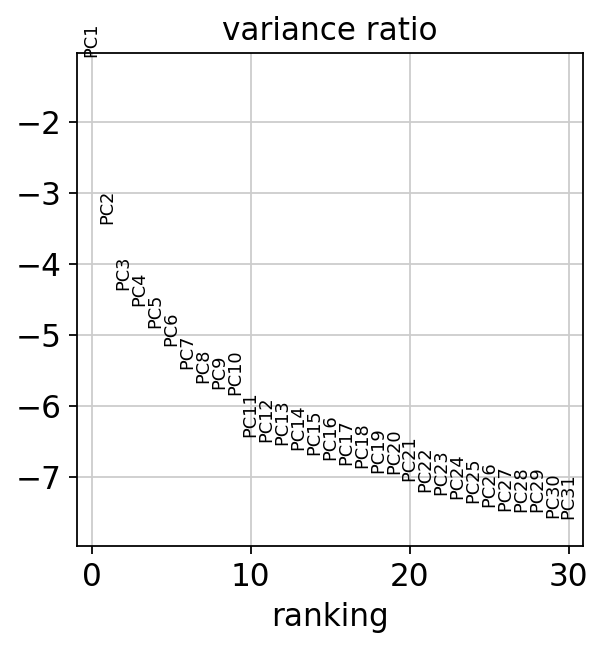

In [45]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 11
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
... storing 'souporcell_assignment' as categorical


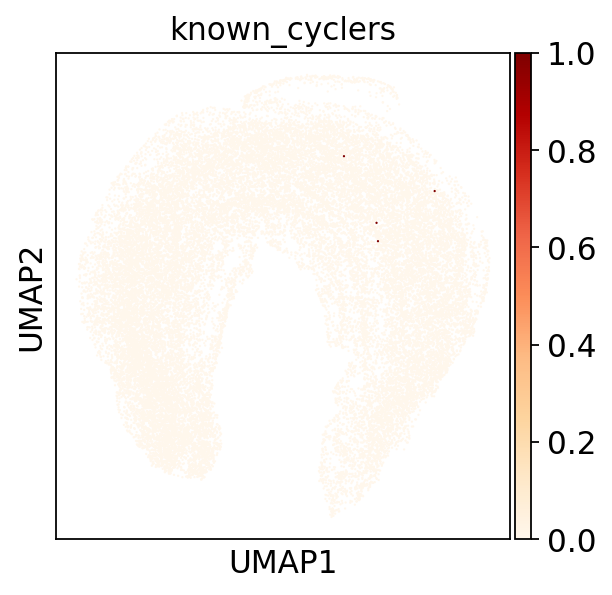

In [47]:
# Identify genes behaving like cc genes
num_pcs = 11
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [1 if gene in ['CDK1','MKI67','CCNB2','PCNA'] else 0 for gene in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 29 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:04)


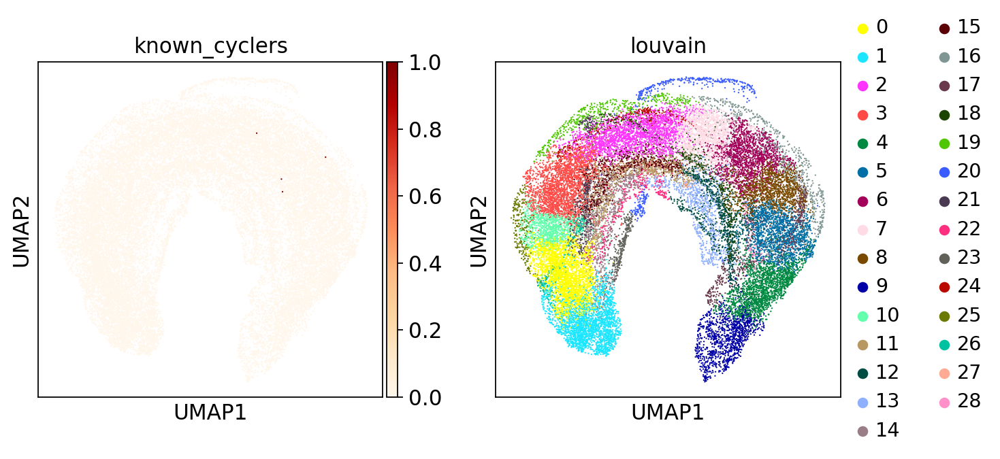

In [53]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.2)
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [54]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


CDK1     6
MKI67    6
CCNB2    7
PCNA     6
Name: louvain, dtype: category
Categories (29, object): ['0', '1', '2', '3', ..., '25', '26', '27', '28']


In [55]:
adata

AnnData object with n_obs × n_vars = 94014 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p'

So removing genes from cluster 6 by filtering the main matrix

In [56]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='6')].index)
# Remove cc genes
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [57]:
adata

View of AnnData object with n_obs × n_vars = 94014 × 27390
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'ccgs'

In [58]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
Trying to set attribute `.obs` of view, copying.
    finished: added
    'S_score', score of gene set (adata.obs).
    403 total control genes are used. (0:00:08)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    340 total control genes are used. (0:00:05)
-->     'phase', cell cycle phase (adata.obs)


In [59]:
adata

AnnData object with n_obs × n_vars = 94014 × 27390
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'ccgs'

_______________________________________________________________________________________________________

In [67]:
# to help annotation, let's read in annotation labels for the first 4 samples of donor P13
annotation_prev = pd.read_csv('/home/jovyan/notebooks/Vento_Lab/MFI_spatial/MFI_sc_sn_Integrated_analysis/unified_annotation_20210915.csv', index_col=0)

In [68]:
annotation_prev

,cell_type_unified,dataset
barcode_sample,,
AAACCCACAAATCCCA-1_WSSS_PLA8764121-0,dM2,P13
AAACCCACAAGCTGCC-1_WSSS_PLA8764121-0,dNK1,P13
AAACCCACATAACCCA-1_WSSS_PLA8764121-0,dS1,P13
AAACCCAGTAGTCGGA-1_WSSS_PLA8764121-0,VCT_p,P13
AAACGAAAGCATCGAG-1_WSSS_PLA8764121-0,VCT_p,P13
...,...,...
TTTCCTCTCCGTAGGC-1_Pla_HDBR8715514-9,dT_cells_CD4+,Reginas
TTTGGTTAGTGCAAGC-1_Pla_HDBR8715514-9,dNK2,Reginas
TTTGGTTCACGGCGTT-1_Pla_HDBR8715514-9,dT_cells_CD8+,Reginas


In [70]:
# removing the last -N that was bc of batches during concatenation in unifying annotation
annotation_prev['barcode_sample_adata_like'] = [elem[:-2] for elem in annotation_prev.index]

In [71]:
annotation_prev

,cell_type_unified,dataset,barcode_sample_adata_like
barcode_sample,,,
AAACCCACAAATCCCA-1_WSSS_PLA8764121-0,dM2,P13,AAACCCACAAATCCCA-1_WSSS_PLA8764121
AAACCCACAAGCTGCC-1_WSSS_PLA8764121-0,dNK1,P13,AAACCCACAAGCTGCC-1_WSSS_PLA8764121
AAACCCACATAACCCA-1_WSSS_PLA8764121-0,dS1,P13,AAACCCACATAACCCA-1_WSSS_PLA8764121
AAACCCAGTAGTCGGA-1_WSSS_PLA8764121-0,VCT_p,P13,AAACCCAGTAGTCGGA-1_WSSS_PLA8764121
AAACGAAAGCATCGAG-1_WSSS_PLA8764121-0,VCT_p,P13,AAACGAAAGCATCGAG-1_WSSS_PLA8764121
...,...,...,...
TTTCCTCTCCGTAGGC-1_Pla_HDBR8715514-9,dT_cells_CD4+,Reginas,TTTCCTCTCCGTAGGC-1_Pla_HDBR8715514
TTTGGTTAGTGCAAGC-1_Pla_HDBR8715514-9,dNK2,Reginas,TTTGGTTAGTGCAAGC-1_Pla_HDBR8715514
TTTGGTTCACGGCGTT-1_Pla_HDBR8715514-9,dT_cells_CD8+,Reginas,TTTGGTTCACGGCGTT-1_Pla_HDBR8715514


In [75]:
len(annotation_prev[annotation_prev['dataset'] == 'P13'])

38608

In [73]:
len(set(adata.obs_names) & set(annotation_prev['barcode_sample_adata_like']))

38608

In [77]:
annotation_prev_copy = annotation_prev.set_index('barcode_sample_adata_like')

In [78]:
annotation_prev_copy

,cell_type_unified,dataset
barcode_sample_adata_like,,
AAACCCACAAATCCCA-1_WSSS_PLA8764121,dM2,P13
AAACCCACAAGCTGCC-1_WSSS_PLA8764121,dNK1,P13
AAACCCACATAACCCA-1_WSSS_PLA8764121,dS1,P13
AAACCCAGTAGTCGGA-1_WSSS_PLA8764121,VCT_p,P13
AAACGAAAGCATCGAG-1_WSSS_PLA8764121,VCT_p,P13
...,...,...
TTTCCTCTCCGTAGGC-1_Pla_HDBR8715514,dT_cells_CD4+,Reginas
TTTGGTTAGTGCAAGC-1_Pla_HDBR8715514,dNK2,Reginas
TTTGGTTCACGGCGTT-1_Pla_HDBR8715514,dT_cells_CD8+,Reginas


In [80]:
adata.obs['annotation_prev'] = [annotation_prev_copy.loc[barcode_sample,'cell_type_unified'] if barcode_sample in annotation_prev_copy.index else '0_none' for barcode_sample in adata.obs.index]


_______________________________________________________________________________________________________

# Subseeting to HVGs & scaling

In [60]:
%%time
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:18)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


CPU times: user 18.3 s, sys: 354 ms, total: 18.7 s
Wall time: 18.7 s


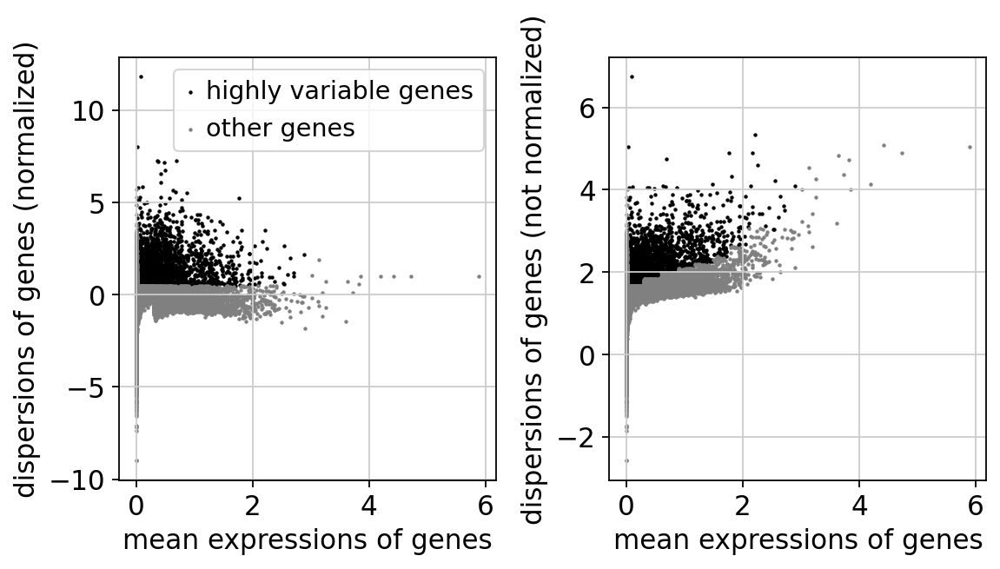

CPU times: user 478 ms, sys: 3.76 ms, total: 482 ms
Wall time: 483 ms


In [61]:
%%time
sc.pl.highly_variable_genes(adata)

In [62]:
adata_hvg = adata[:, adata.var['highly_variable']]

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [63]:
adata_hvg

View of AnnData object with n_obs × n_vars = 94014 × 4000
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'ccgs', 'hvg'

In [64]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

/opt/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


CPU times: user 4.82 s, sys: 2.34 s, total: 7.16 s
Wall time: 7.17 s


________

### PCA

In [65]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:44)


CPU times: user 5min, sys: 33.6 s, total: 5min 34s
Wall time: 44.4 s


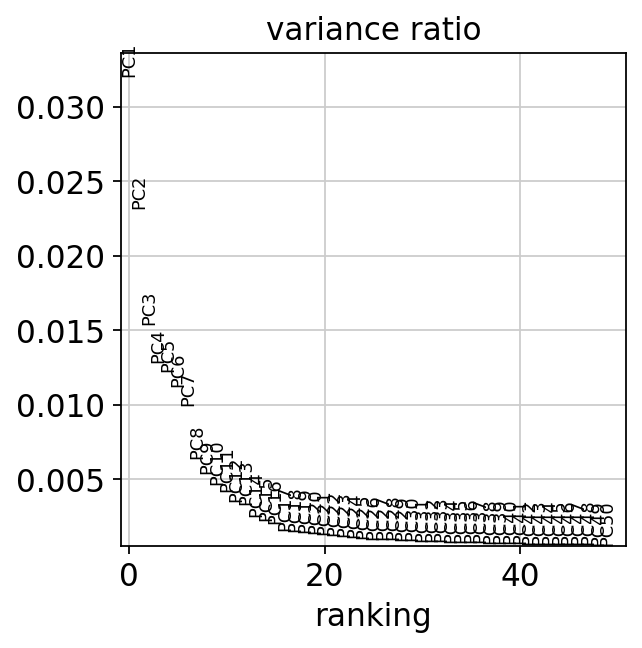

In [66]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

In [81]:
%%time
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=17)

computing neighbors
    using 'X_pca' with n_pcs = 17
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


CPU times: user 16.9 s, sys: 32 s, total: 48.9 s
Wall time: 8 s


__________________________________________________________________________________________________________________________________________________________________

In [82]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:52)


CPU times: user 2min 52s, sys: 1min 21s, total: 4min 14s
Wall time: 52.4 s


# Plotting

In [85]:
np.unique(adata_hvg.obs['annotation_prev'])

array(['0_none', 'DC1', 'EVT_1', 'EVT_2', 'EVT_3', 'Endo_F', 'Endo_L',
       'Endo_M', 'GC', 'HOFB', 'SCT', 'VCT', 'VCT_CCC', 'VCT_fusing',
       'VCT_p', 'dEpi_secretory', 'dM2', 'dNK1', 'dNK3', 'dPV1', 'dS1',
       'dS3', 'eEVT', 'fF', 'fPV', 'iEVT', 'uSMC'], dtype=object)

In [86]:
# colors for unified annotation
colors_df = pd.read_csv('/home/jovyan/notebooks/Vento_Lab/MFI_spatial/MFI_sc_sn_Integrated_analysis/colors_union_20210915.csv', index_col=0)
colors_df

,color
B_cells,#e3cee4
DC1,#d5e7f7
DC2,#d6d4eb
EVT_1,#d895ea
EVT_2,#9f6bac
EVT_3,#bf4cea
Endo_F,#b9a96b
Endo_L,#f8f4a8
Endo_M,#eacf68
GC,#DBC7DE


In [89]:
list(colors_df.loc[np.unique(adata_hvg.obs['annotation_prev'])[1:], 'color'])

['#d5e7f7',
 '#d895ea',
 '#9f6bac',
 '#bf4cea',
 '#b9a96b',
 '#f8f4a8',
 '#eacf68',
 '#DBC7DE',
 '#69b4ce',
 '#eb5376',
 '#ecdbe5',
 '#e7a3c8',
 '#b53279',
 '#e96db3',
 '#c35338',
 '#66cef6',
 '#deeab1',
 '#2d563c',
 '#6b6a6b',
 '#c9bdb2',
 '#eaa944',
 '#FF1200',
 '#a79388',
 '#aeb1b7',
 '#510058',
 '#f37a73']

In [101]:
palette_new = ['lightgrey', # none / new samples data
               '#d5e7f7',
                 '#d895ea',
                 '#9f6bac',
                 '#bf4cea',
                 '#b9a96b',
                 '#f8f4a8',
                 '#eacf68',
                 '#DBC7DE',
                 '#69b4ce',
                 '#eb5376',
                 '#ecdbe5',
                 '#e7a3c8',
                 '#b53279',
                 '#e96db3',
                 '#c35338',
                 '#66cef6',
                 '#deeab1',
                 '#2d563c',
                 '#6b6a6b',
                 '#c9bdb2',
                 '#eaa944',
                 '#FF1200',
                 '#a79388',
                 '#aeb1b7',
                 '#510058',
                 '#f37a73']


In [91]:
adata_hvg

AnnData object with n_obs × n_vars = 94014 × 4000
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca'

### No batch correction

17 PCs

... storing 'souporcell_assignment' as categorical
... storing 'phase' as categorical
... storing 'annotation_prev' as categorical


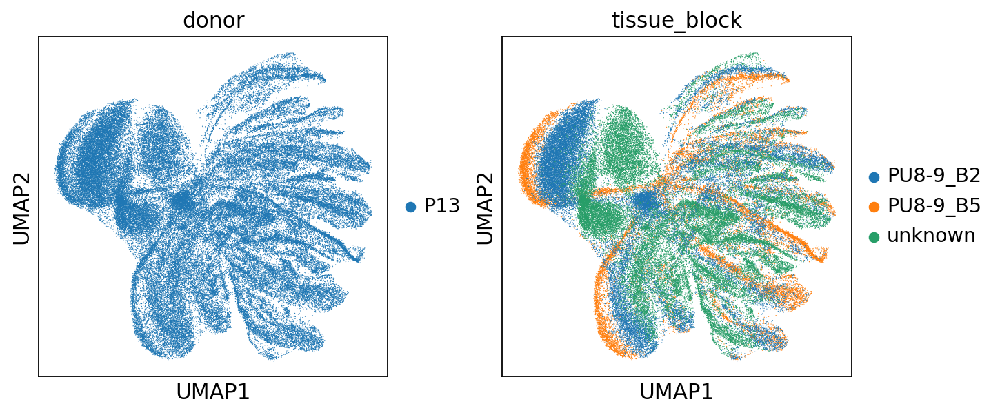

In [92]:
sc.pl.umap(adata_hvg, color=['donor','tissue_block'])

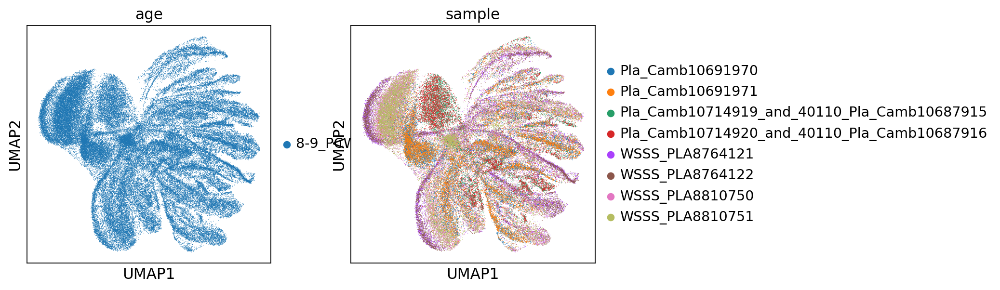

In [93]:
sc.pl.umap(adata_hvg, color=['age','sample'])

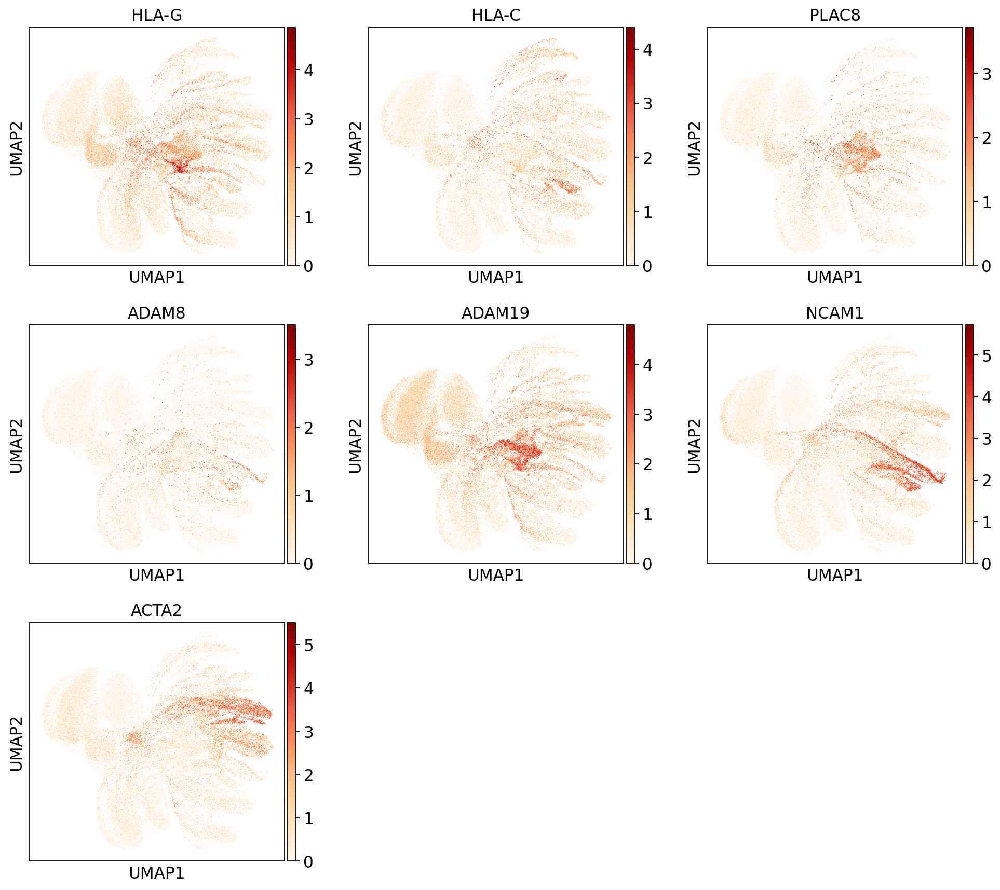

In [94]:
sc.pl.umap(adata_hvg, color=['HLA-G','HLA-C','PLAC8',
                             'ADAM8','ADAM19',
                            'NCAM1','ACTA2'], ncols=3, use_raw=True, cmap='OrRd')

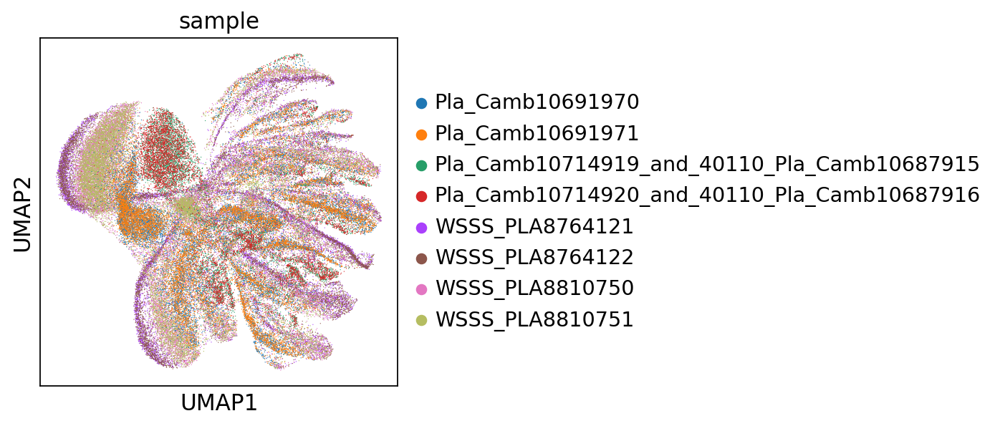

In [95]:
sc.pl.umap(adata_hvg, color=['sample'])

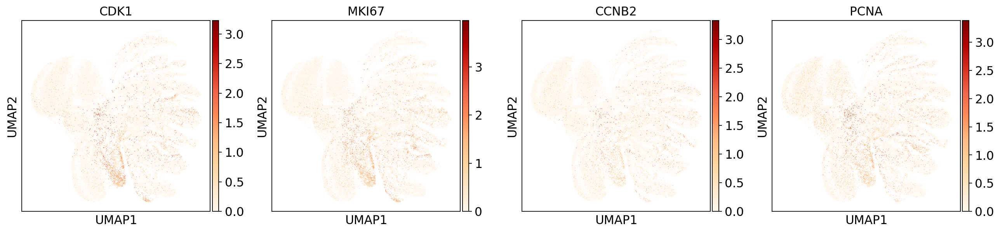

In [96]:
sc.pl.umap(adata_hvg, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [97]:
adata_hvg

AnnData object with n_obs × n_vars = 94014 × 4000
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap', 'donor_colors', 

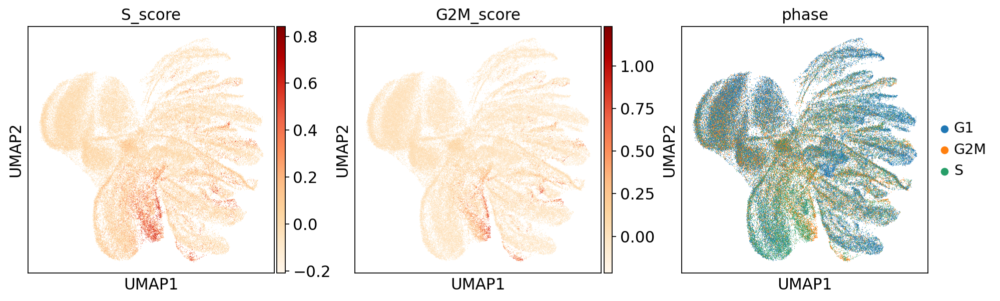

In [98]:
sc.pl.umap(adata_hvg, color=['S_score','G2M_score','phase'], cmap='OrRd')

In [99]:
adata_hvg

AnnData object with n_obs × n_vars = 94014 × 4000
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap', 'donor_colors', 

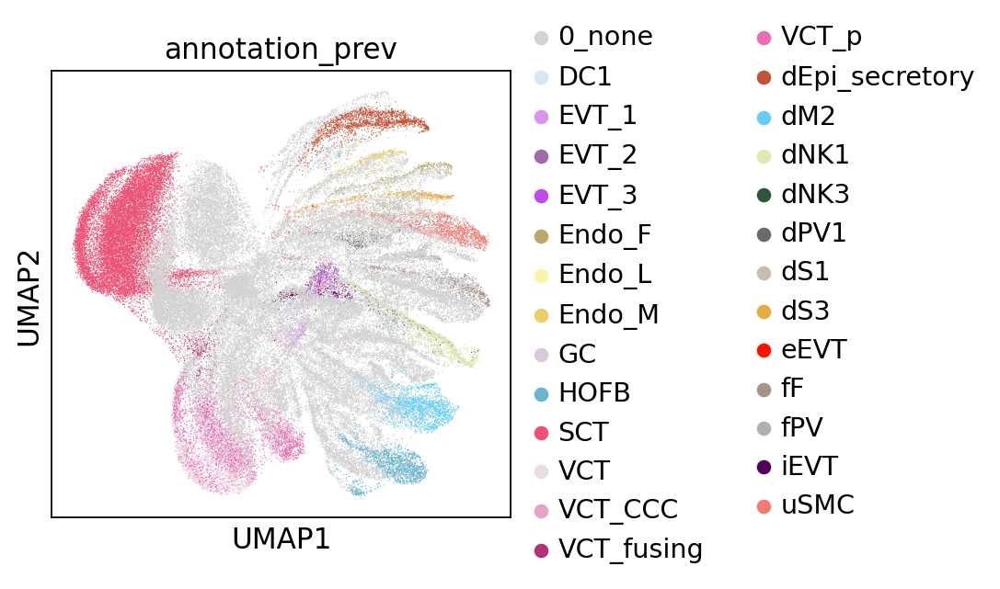

In [102]:
# 'annotation_prev' comes from previous analysis + annotation of this dataset 
# (harmony integration route, no longer used but annotations are trustworthy & useful to guide me here)
sc.pl.umap(adata_hvg, color=['annotation_prev'], palette=palette_new)

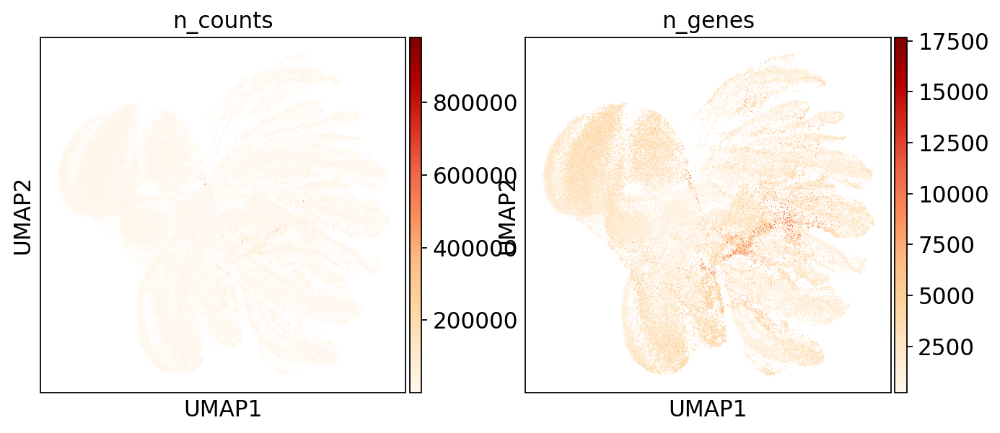

In [103]:
sc.pl.umap(adata_hvg, color=['n_counts',
                             'n_genes'], cmap='OrRd')

In [101]:
#adata_hvg.write(save_path+'adata_hvg_preproc_regressed_P13.h5ad')

### Second step of Bertie doublet calling

In [104]:
# reading the full object to retrieve 'is_doublet' labels
adata = sc.read(save_path+'adata_raw_filtered.h5ad')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 32 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:22)


         is_doublet
louvain            
0          0.001075
1          0.007181
2          0.007671
3          0.032084
4          0.077497
5          0.013675
6          0.232721
7          0.084589
8          0.040511
9          0.001595
10         0.012366
11         0.181460
12         0.074063
13         0.023488
14         0.041130
15         0.019593
16         0.026223
17         0.010484
18         0.413928
19         0.083333
20         0.191185
21         0.088235
22         0.013857
23         0.229320
24         0.715347
25         0.762771
26         0.190736
27         0.207457
28         0.144092
29         0.147497
30         0.013043
31         0.753289


/opt/conda/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


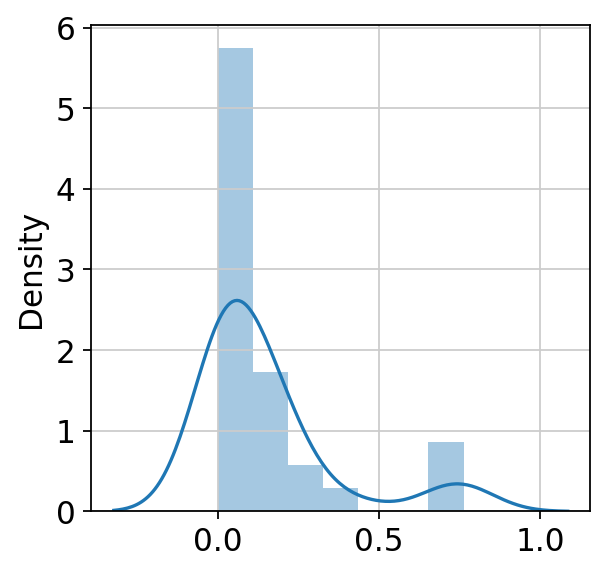

In [105]:
sc.tl.louvain(adata_hvg, random_state=0)
cluster_key = 'louvain'

doublet_counts = adata_hvg.obs.loc[:,['is_doublet', cluster_key]].groupby(cluster_key).mean()
#this can be printed for a summary of per-population doublet frequency...
print(doublet_counts)
#...or shown as a histogram for a potentially useful visualisation
sns.distplot(doublet_counts)

#the actual computation happens here
med = np.median(doublet_counts)
mask = doublet_counts.values>med
mad = np.median(doublet_counts.values[mask]-med)
pvals = 1-scipy.stats.norm.cdf(doublet_counts, loc=med, scale=1.4826*mad)
pvals_adj = bh(pvals)
doublet_populations = list(doublet_counts.index[pvals_adj<0.1])

# adding 'is_doublet' annotation by throsholding the bh_pvalue, this is not the end of doublet calling
# this parameter can be tweaked according to how harsh the detection needs to be
# the less it is, the less doublets it will call
adata.obs['is_doublet'] = adata.obs['bh_pval'] < 0.1


#flag the entirety of the doublet populations as doublets
adata_hvg.obs['is_doublet_propagate'] = adata.obs['is_doublet'].copy()
adata_hvg.obs.loc[[i in doublet_populations for i in adata_hvg.obs[cluster_key]],'is_doublet_propagate'] = True

### Actually removing the doublets

At this step it's best to look at both ```is_doublet``` annotation from the 1st step of bertie doublet calling and ```is_doublet_poptrim``` from this second step and decide which one to use - in our case it seems like the latter is a bit too harsh

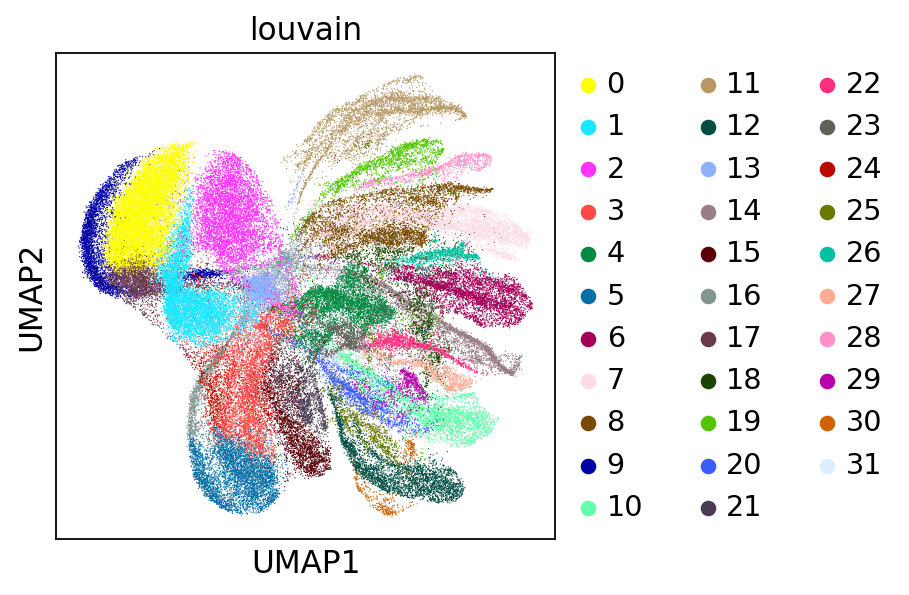

In [106]:
sc.pl.umap(adata_hvg, color=['louvain'])

In [109]:
adata_hvg.obs['is_doublet'] = [1 if elem == True else 0 for elem in adata_hvg.obs['is_doublet']]
adata_hvg.obs['is_doublet_propagate'] = [1 if elem == True else 0 for elem in adata_hvg.obs['is_doublet_propagate']]

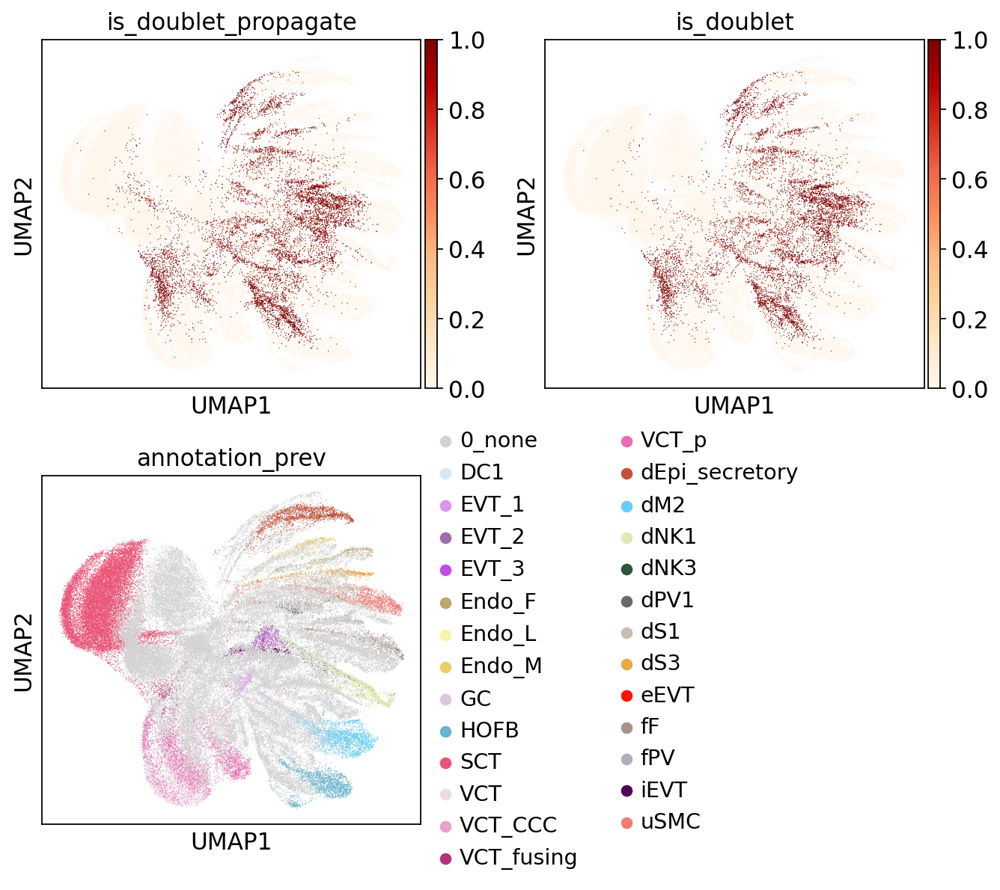

In [110]:
# bh_pval < 0.1
sc.pl.umap(adata_hvg, color=['is_doublet_propagate','is_doublet',
                             'annotation_prev'], 
           ncols = 2, cmap='OrRd')

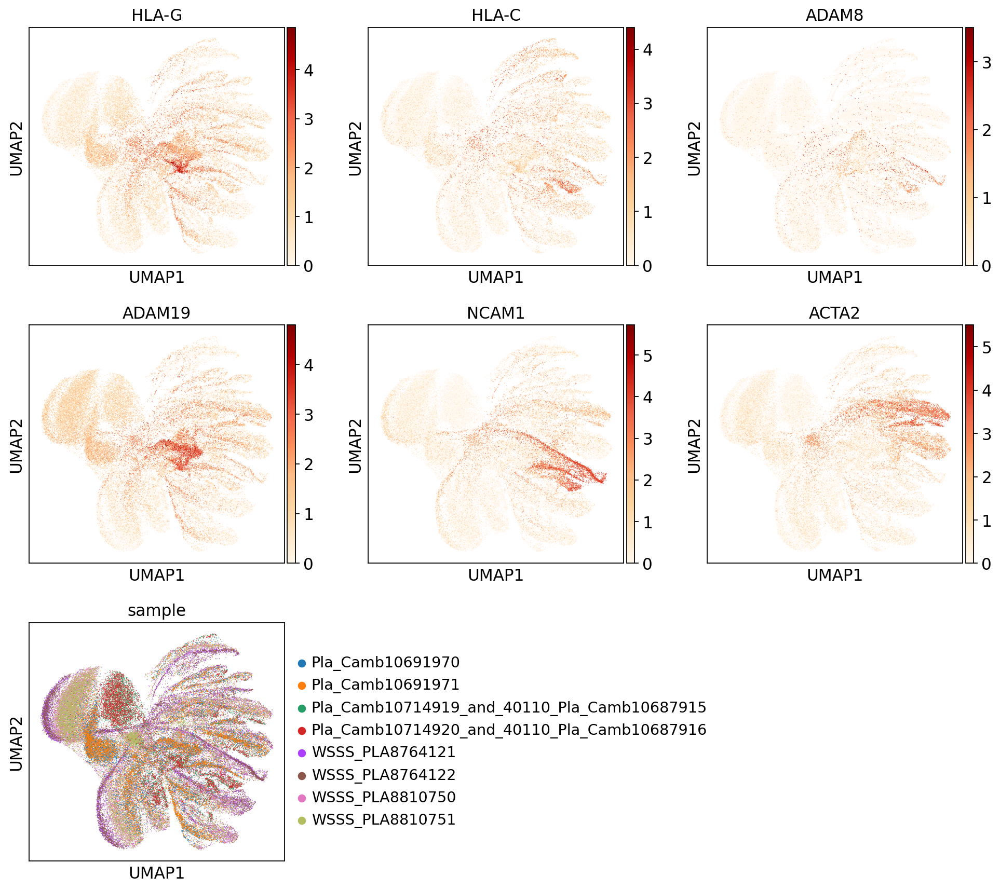

In [111]:
sc.pl.umap(adata_hvg, color=['HLA-G','HLA-C','ADAM8','ADAM19',
                            'NCAM1','ACTA2','sample'], ncols=3, use_raw=True, cmap='OrRd')

# Looking at souporcell results to assign `origin_M_F`

Deciding/orienting in which cluster is maternal/fetal by which cell states are present in each genotype cluster

In [112]:
np.unique(adata_hvg.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

Trying to set attribute `.uns` of view, copying.


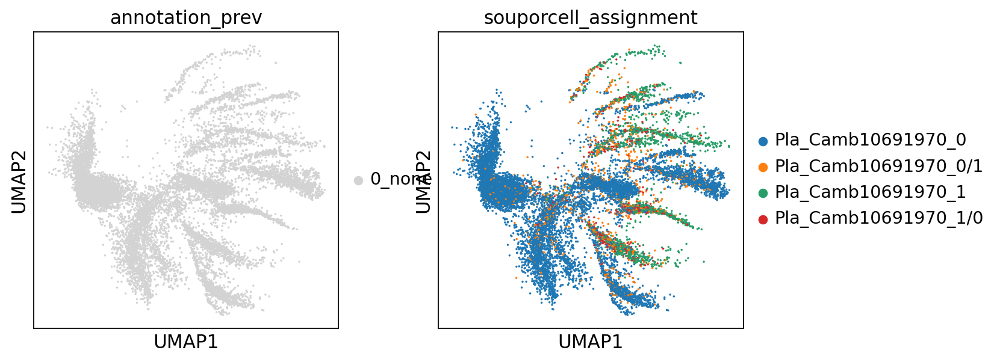

In [114]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'Pla_Camb10691970'], color=['annotation_prev','souporcell_assignment'])

### Pla_Camb10691970: 0 is F, 1 is M

Trying to set attribute `.uns` of view, copying.


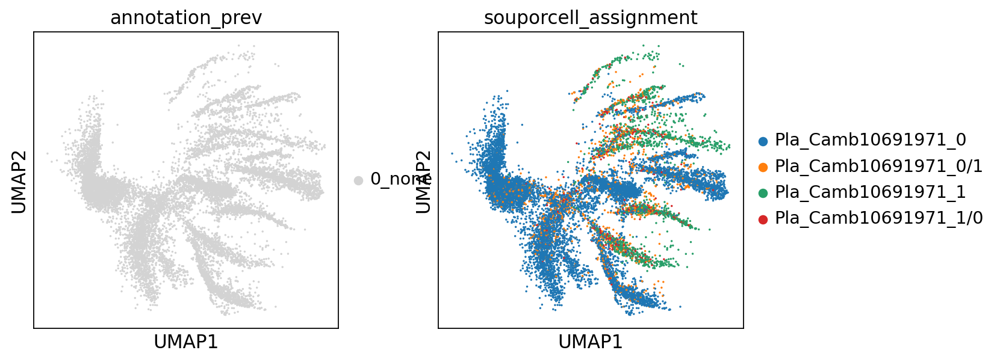

In [118]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'Pla_Camb10691971'], color=['annotation_prev','souporcell_assignment'])

### Pla_Camb10691971: 0 is F, 1 is M

Trying to set attribute `.uns` of view, copying.


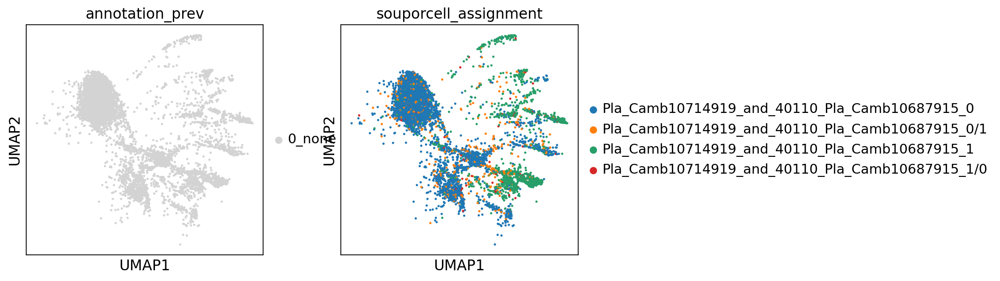

In [119]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'Pla_Camb10714919_and_40110_Pla_Camb10687915'], color=['annotation_prev','souporcell_assignment'])

### Pla_Camb10714919_and_40110_Pla_Camb10687915: 0 is F, 1 is M

Trying to set attribute `.uns` of view, copying.


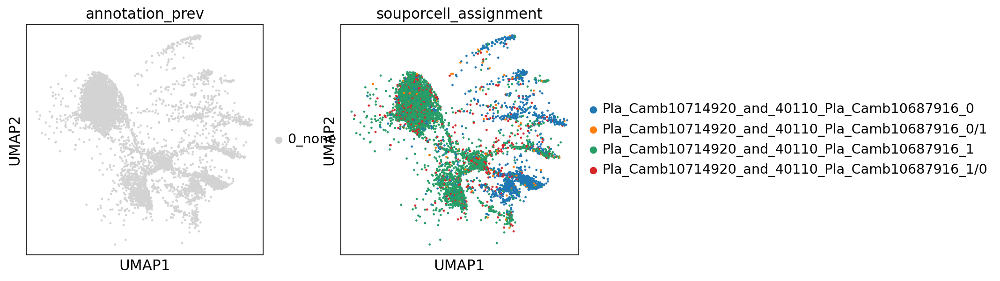

In [120]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'Pla_Camb10714920_and_40110_Pla_Camb10687916'], color=['annotation_prev','souporcell_assignment'])

### Pla_Camb10714919_and_40110_Pla_Camb10687915: 0 is M, 1 is F

Trying to set attribute `.uns` of view, copying.


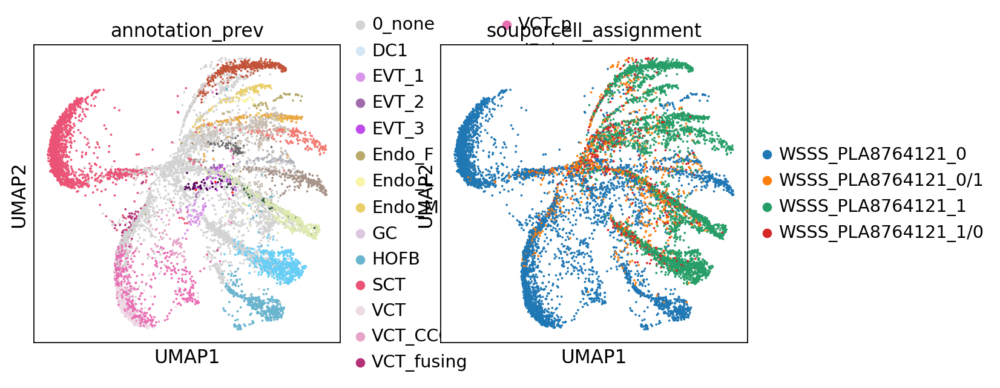

In [121]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'WSSS_PLA8764121'], color=['annotation_prev','souporcell_assignment'])

### WSSS_PLA8764121: 0 is F, 1 is M

Trying to set attribute `.uns` of view, copying.


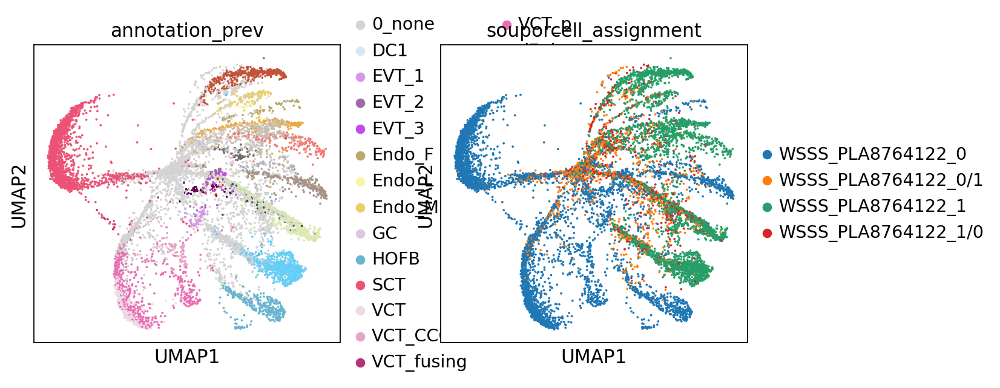

In [123]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'WSSS_PLA8764122'], color=['annotation_prev','souporcell_assignment'])

### WSSS_PLA8764122: 0 is F, 1 is M

Trying to set attribute `.uns` of view, copying.


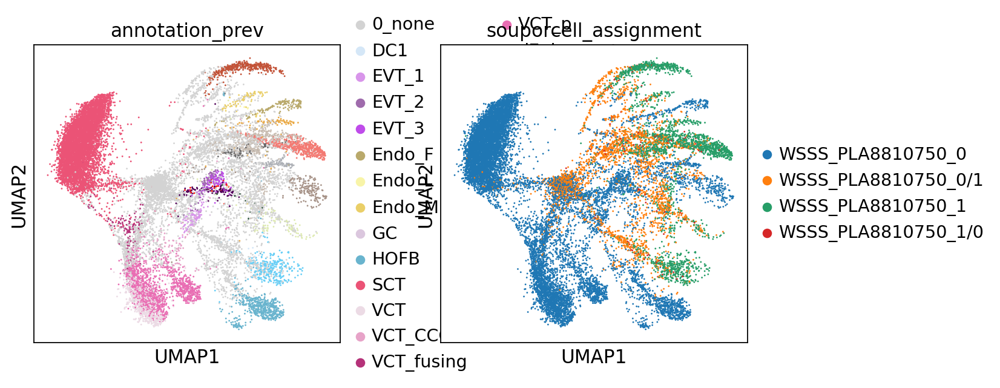

In [124]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'WSSS_PLA8810750'], color=['annotation_prev','souporcell_assignment'])

### WSSS_PLA8810750: 0 is F, 1 is M

Trying to set attribute `.uns` of view, copying.


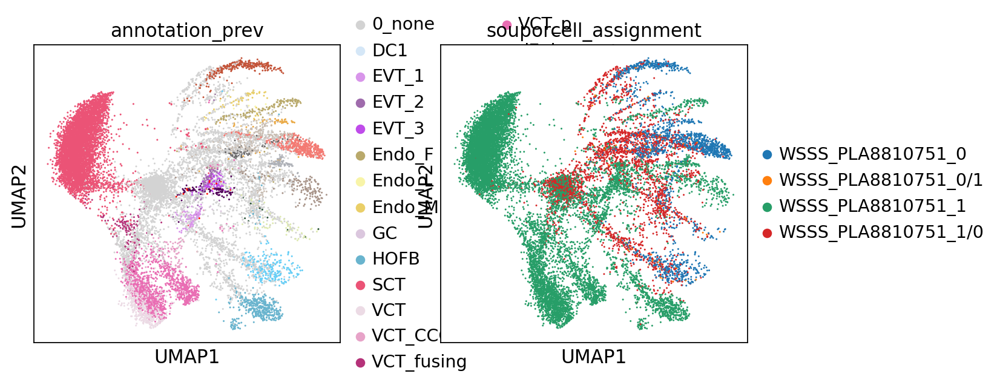

In [125]:
sc.pl.umap(adata_hvg[adata_hvg.obs['sample'] == 'WSSS_PLA8810751'], color=['annotation_prev','souporcell_assignment'])

### WSSS_PLA8810751: 0 is M, 1 is F

In [129]:
def add_origin_M_F(adata_obj, barcode_sample):
    
    curr_souporcell_assignment = adata_obj.obs.loc[barcode_sample,'souporcell_assignment']
    
    if curr_souporcell_assignment in ['Pla_Camb10691970_0','Pla_Camb10691971_0',
                                      'Pla_Camb10714919_and_40110_Pla_Camb10687915_0','Pla_Camb10714920_and_40110_Pla_Camb10687916_1',
                                      'WSSS_PLA8764121_0','WSSS_PLA8764122_0',
                                      'WSSS_PLA8810750_0','WSSS_PLA8810751_1'
                                     ]:
        return('F')
    
    elif curr_souporcell_assignment in ['Pla_Camb10691970_1','Pla_Camb10691971_1',
                                      'Pla_Camb10714919_and_40110_Pla_Camb10687915_1','Pla_Camb10714920_and_40110_Pla_Camb10687916_0',
                                      'WSSS_PLA8764121_1','WSSS_PLA8764122_1',
                                      'WSSS_PLA8810750_1','WSSS_PLA8810751_0'
                                     ]:
        return('M')
    
    else:
        return('soc_doublet')
    

In [130]:
adata_hvg.obs['origin_M_F'] = adata_hvg.obs['barcode_sample_copy'].apply(lambda x: add_origin_M_F(adata_hvg, x))

In [132]:
adata_hvg.obs['inter_ind_doublet'] = [1 if elem == True else 0 for elem in adata_hvg.obs['inter_ind_doublet']]

... storing 'origin_M_F' as categorical


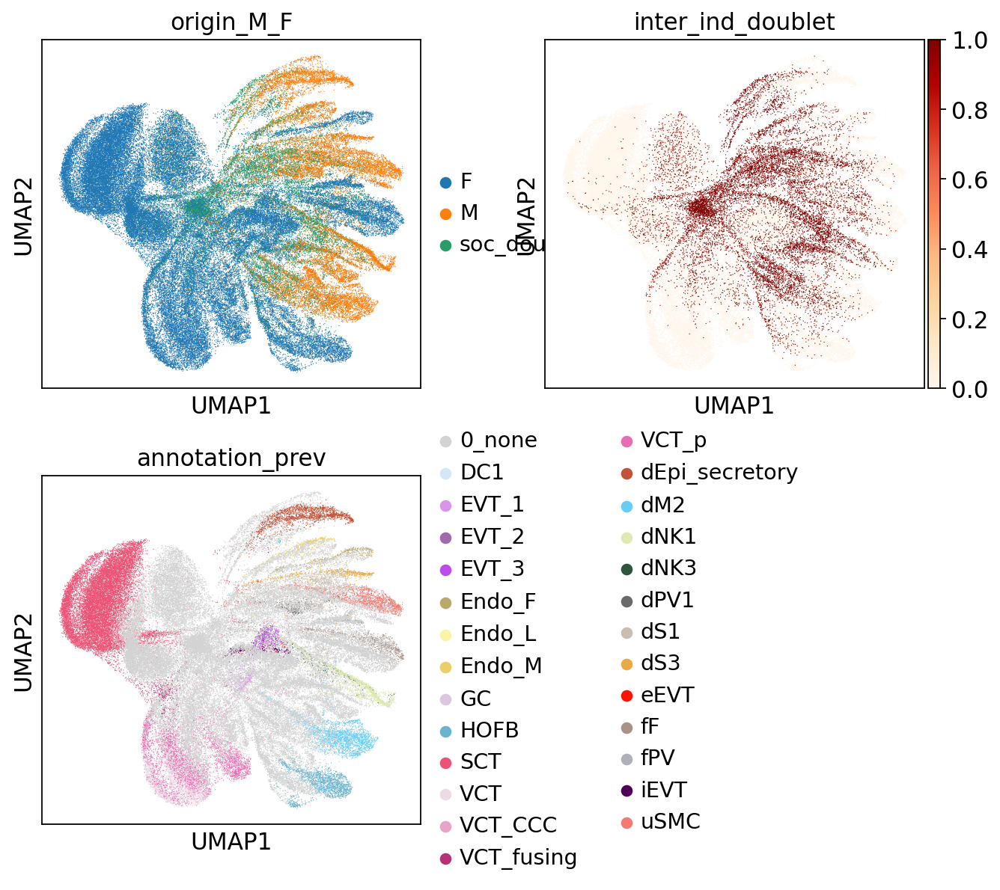

In [133]:
sc.pl.umap(adata_hvg, color=['origin_M_F','inter_ind_doublet',
                             'annotation_prev'], 
           ncols = 2, cmap='OrRd')

In [138]:
adata_hvg.write(save_path + 'adata_hvg_prelim_no_batch_corr.h5ad')

In [134]:
adata_hvg_nodoublets = adata_hvg[(adata_hvg.obs['inter_ind_doublet'] == 0)
                                & (adata_hvg.obs['is_doublet'] == 0)].copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


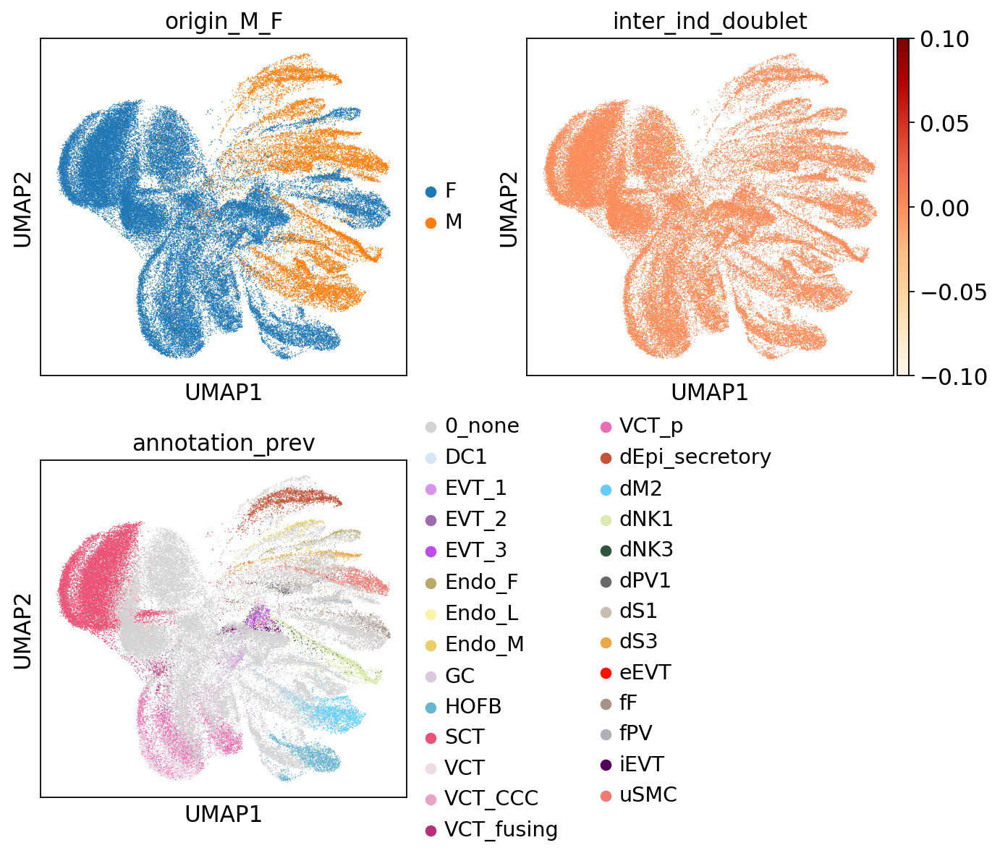

In [135]:
sc.pl.umap(adata_hvg_nodoublets, color=['origin_M_F','inter_ind_doublet',
                             'annotation_prev'], 
           ncols = 2, cmap='OrRd')

In [137]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

In [139]:
# saving a table indicating all barcodes after exclusion of genotype and GEX doublets
adata_hvg_nodoublets.obs.to_csv(save_path + 'obs_table_nodoublets.csv')